# Analysis of Diaz2019 human IPS data

Before proceeding, download the inDrops counts tables here:<br>
https://kleintools.hms.harvard.edu/paper_websites/diaz_2019/Diaz2019_inDropsCountsTables.zip

Check out our web portal for fully analyzed interactive versions of the single-cell data: <br>
https://tinyurl.com/DiazPourquie2019

### Import Packages

In [1]:
# Import packages
import pandas as pd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import scipy.sparse
import os
import sys
import bbknn
import pickle

sys.path.append('../')
import helper_functions_dew as dew

In [2]:
# ScanPy settings
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=120)  # low dpi (dots per inch) yields small inline figures
sc.logging.print_versions()

# Matplotlib settings
plt.rcParams['pdf.fonttype']=42  # Necessary to export text (rather than curves) in pdf files

scanpy==1.4.3+0.g85acb6c.dirty anndata==0.6.19 umap==0.3.8 numpy==1.16.2 scipy==1.2.1 pandas==0.24.2 scikit-learn==0.20.3 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 


### Import Libraries

_________________ OP001
Loading from npz file
(4037, 25476) 

_________________ OP002
Loading from npz file
(2755, 25476) 

_________________ OP003
Loading from npz file
(2175, 25476) 

_________________ OP004
Loading from npz file
(2780, 25476) 

_________________ OP005
Loading from npz file
(3518, 25476) 

_________________ OP006
Loading from npz file
(3816, 25476) 

_________________ OP007
Loading from npz file
(2868, 25476) 

_________________ OP008
Loading from npz file
(2962, 25476) 

_________________ OP009
Loading from npz file
(2391, 25476) 



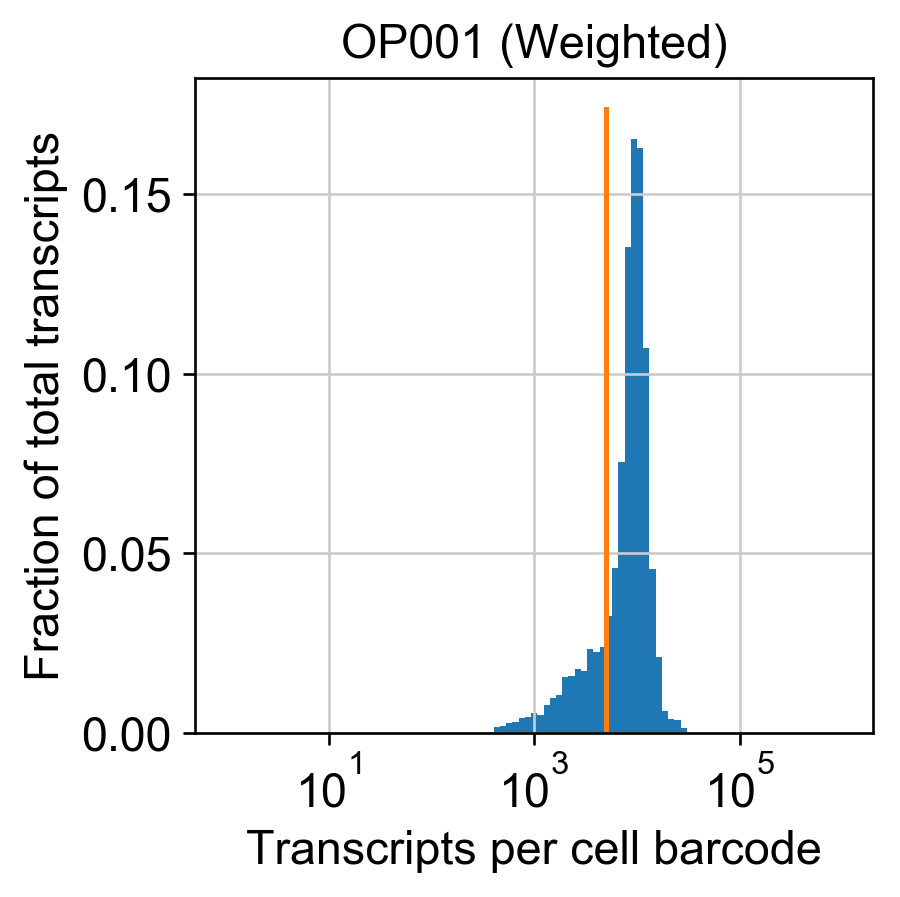

Filtering barcodes for OP001  ( 1854 / 4037 )
filtered out 2183 cells that have less than 5000 counts


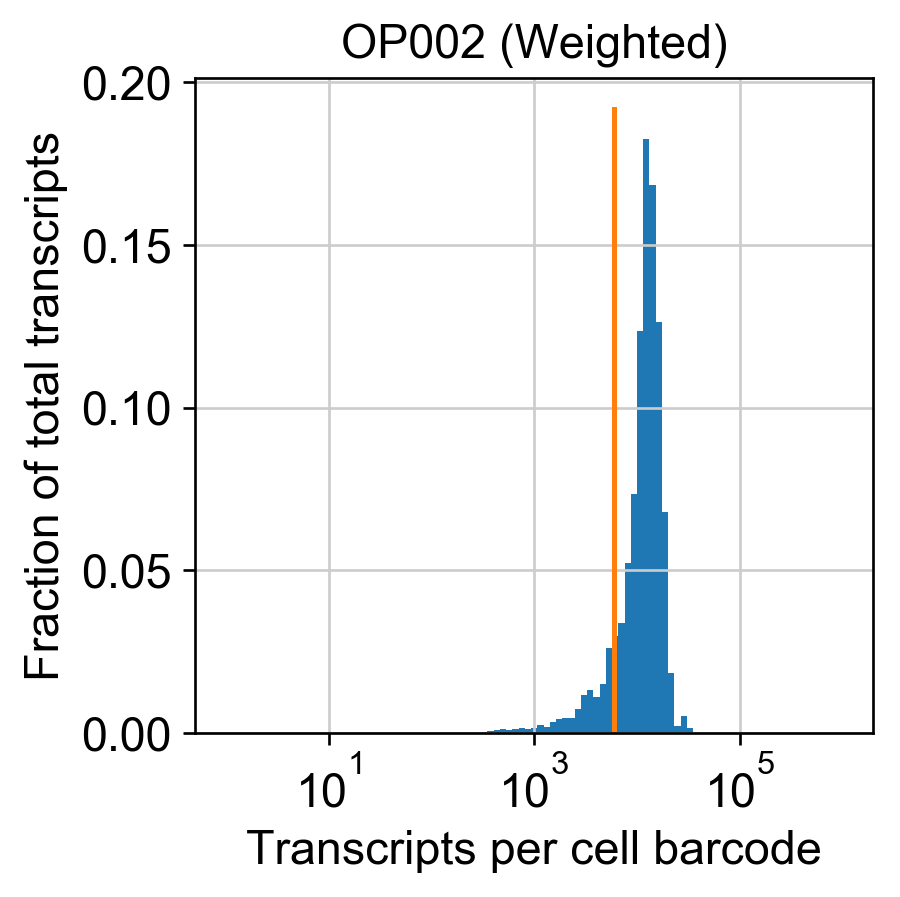

Filtering barcodes for OP002  ( 1580 / 2755 )
filtered out 1175 cells that have less than 6000 counts


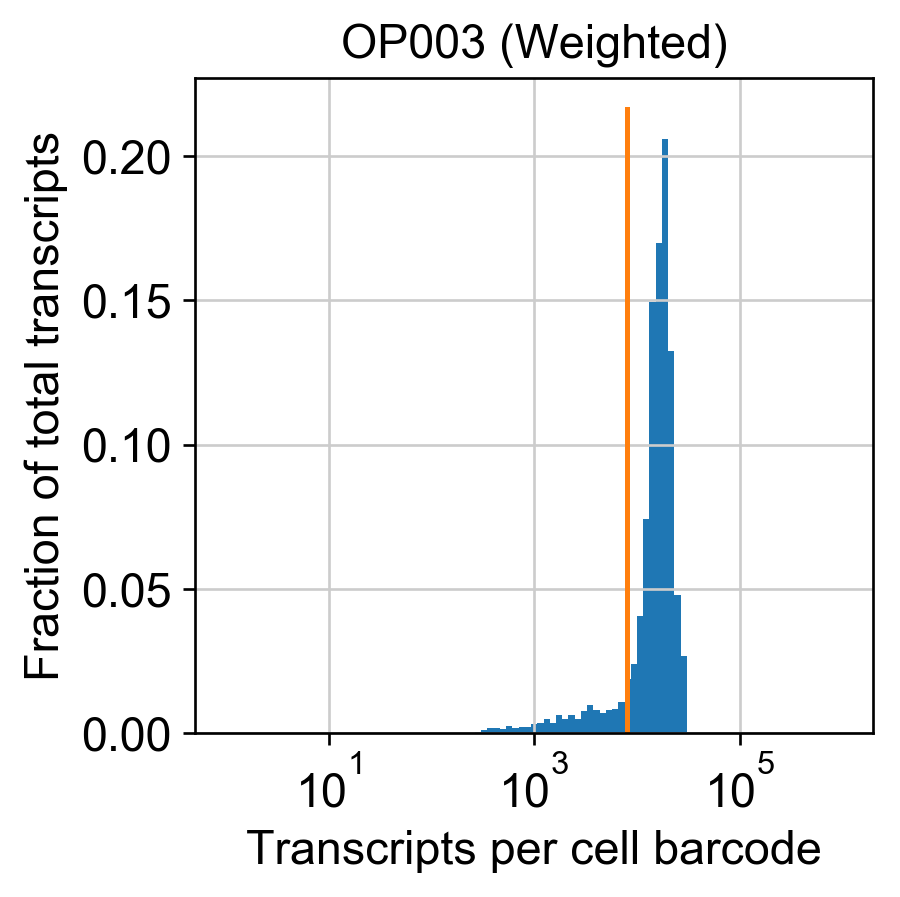

Filtering barcodes for OP003  ( 978 / 2175 )
filtered out 1197 cells that have less than 8000 counts


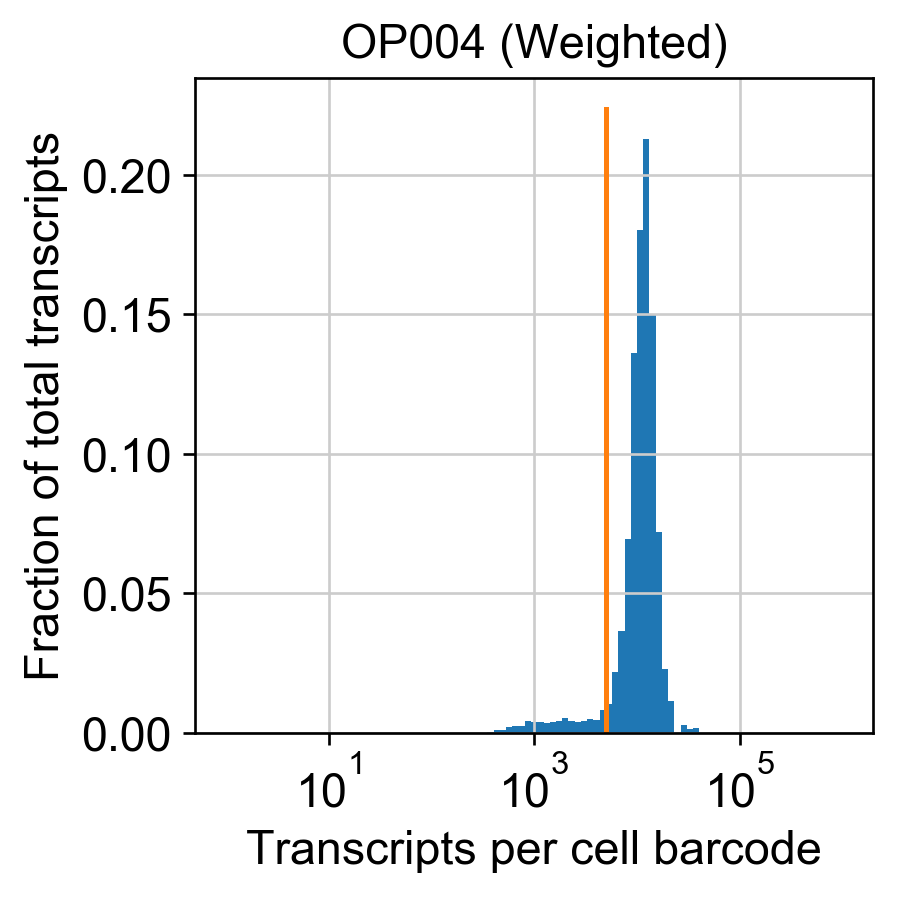

Filtering barcodes for OP004  ( 1746 / 2780 )
filtered out 1034 cells that have less than 5000 counts


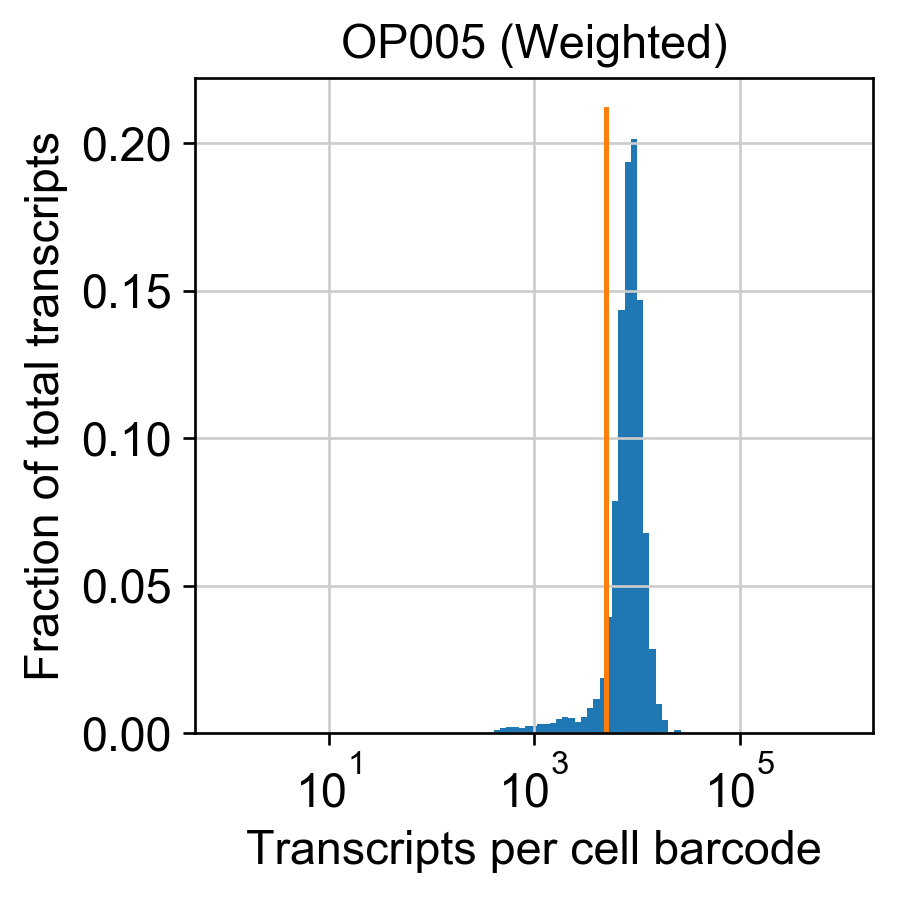

Filtering barcodes for OP005  ( 2433 / 3518 )
filtered out 1085 cells that have less than 5000 counts


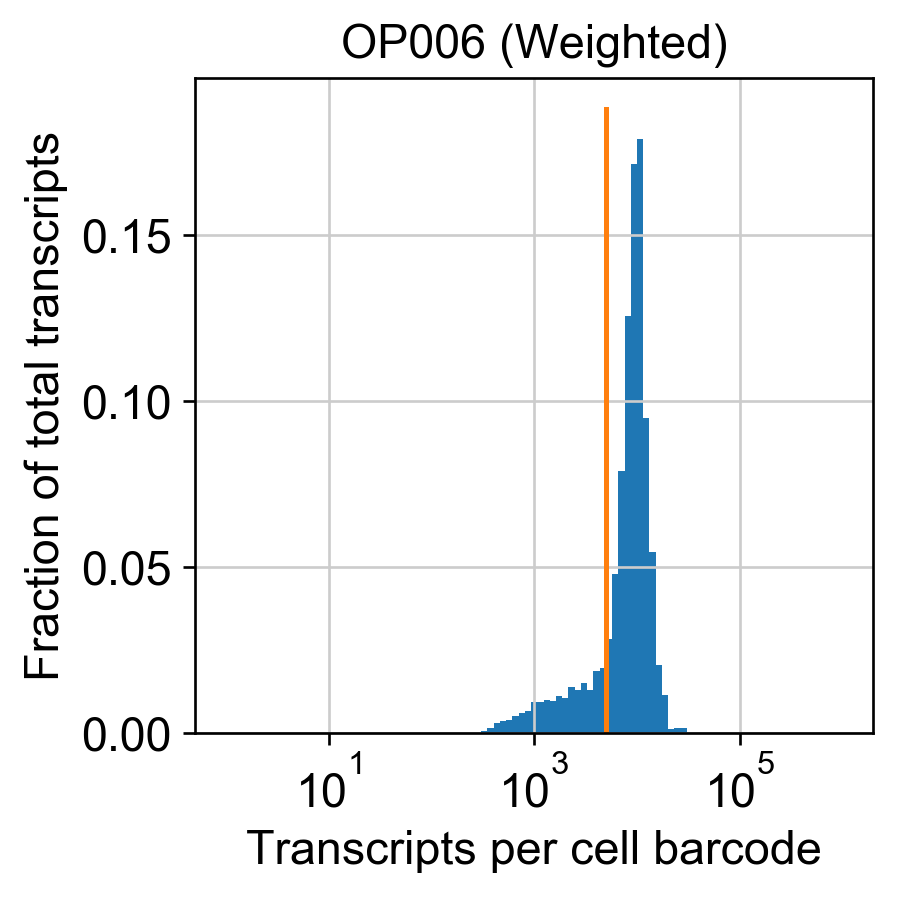

Filtering barcodes for OP006  ( 1596 / 3816 )
filtered out 2220 cells that have less than 5000 counts


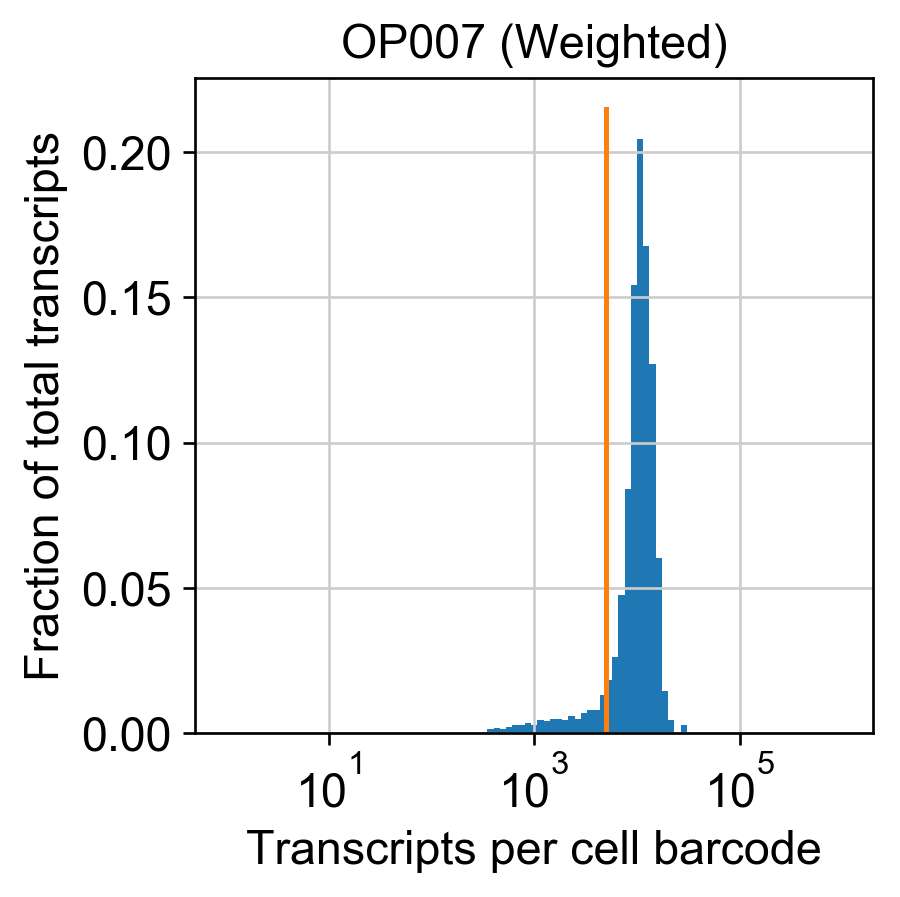

Filtering barcodes for OP007  ( 1686 / 2868 )
filtered out 1182 cells that have less than 5000 counts


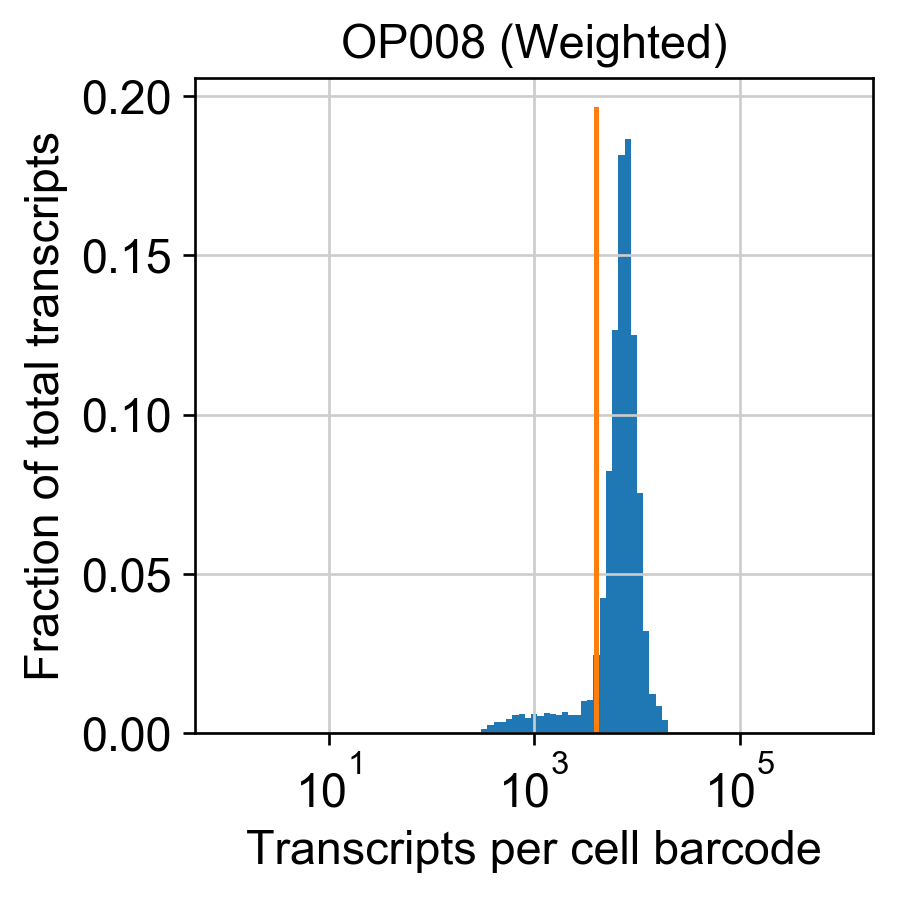

Filtering barcodes for OP008  ( 1682 / 2962 )
filtered out 1280 cells that have less than 4000 counts


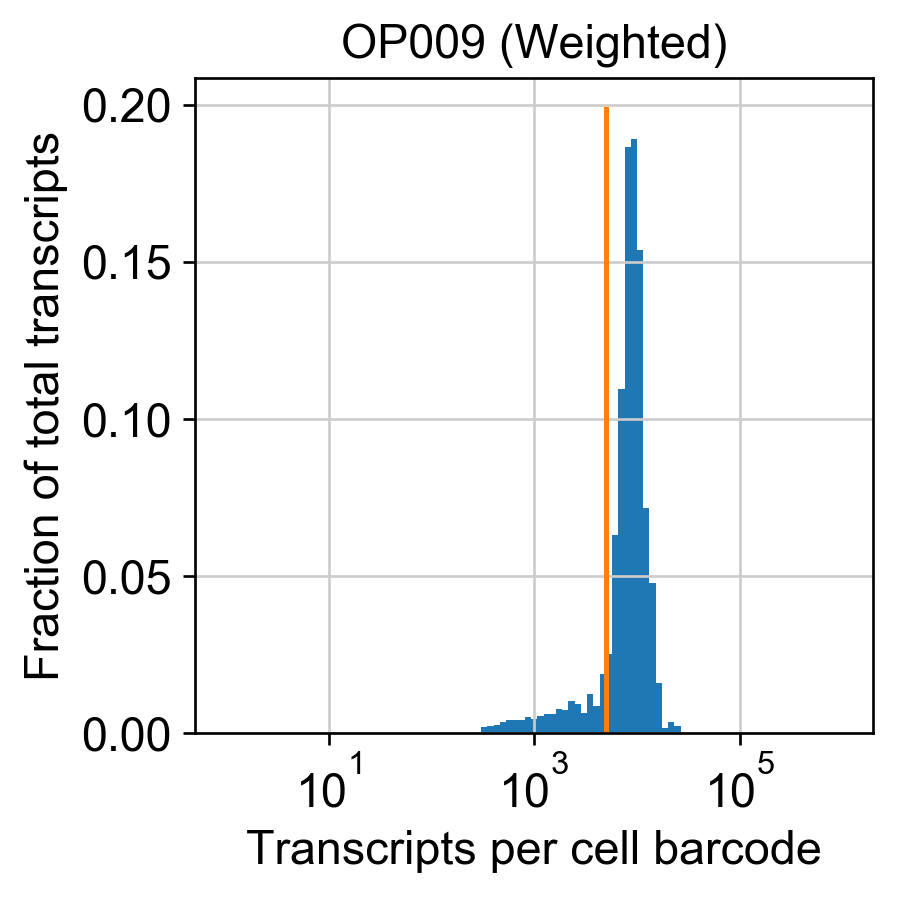

Filtering barcodes for OP009  ( 1195 / 2391 )
filtered out 1196 cells that have less than 5000 counts

 AnnData object with n_obs × n_vars = 14750 × 25476 
    obs: 'batch', 'cell_names', 'library_id', 'n_counts', 'unique_cell_id'


In [3]:
# load libraries
#input_path = '/Users/dan/Dropbox (HMS)/Data/inDrops/OP_Oscillations/' # full path to all inDrops datasets
input_path = '../_rawData/' # full path to all inDrops datasets
libnames_hsiPS = ['OP001','OP002','OP003','OP004','OP005','OP006','OP007','OP008','OP009']
hsiPS = dew.load_inDrops_V3(libnames_hsiPS, input_path)

# set barcode abundance threshold
hsiPS['OP001']['adata'].uns['counts_thresh'] = 5000
hsiPS['OP002']['adata'].uns['counts_thresh'] = 6000
hsiPS['OP003']['adata'].uns['counts_thresh'] = 8000
hsiPS['OP004']['adata'].uns['counts_thresh'] = 5000
hsiPS['OP005']['adata'].uns['counts_thresh'] = 5000
hsiPS['OP006']['adata'].uns['counts_thresh'] = 5000
hsiPS['OP007']['adata'].uns['counts_thresh'] = 5000
hsiPS['OP008']['adata'].uns['counts_thresh'] = 4000
hsiPS['OP009']['adata'].uns['counts_thresh'] = 5000

# perform filtering
for s in libnames_hsiPS:
    dew.filter_abundant_barcodes(hsiPS[s]['adata']) # filter and save histogram plots to file
    
# merge all libraries    
hsiPS = hsiPS['OP001']['adata'].concatenate(hsiPS['OP002']['adata'],hsiPS['OP003']['adata'],hsiPS['OP004']['adata'],
                                            hsiPS['OP005']['adata'],hsiPS['OP006']['adata'],hsiPS['OP007']['adata'],
                                            hsiPS['OP008']['adata'],hsiPS['OP009']['adata'])
print('\n',hsiPS)

### Add Library Annotations

In [4]:
# Specify timepoints for each library_id
timepoint_dict = {'d0':['OP001'],
                  'd1':['OP002','OP003'],
                  'd2':['OP004','OP005'],
                  'd3':['OP006','OP007'],
                  'd4':['OP008','OP009']}

# Invert the dictionary
timepoint_dict_inv = dict((v,k) for k in timepoint_dict for v in timepoint_dict[k])

# Generate time_ids
timepoint_id = []
for s in hsiPS.obs['library_id']:
    timepoint_id.append(timepoint_dict_inv[s])
hsiPS.obs['time_id'] = timepoint_id

### Save AnnData DataSet to File

In [5]:
hsiPS.obs.to_csv('Diaz2019_hsiPS_loaded_obs.csv')
hsiPS.write('Diaz2019_hsiPS_loaded.h5ad')

... storing 'cell_names' as categorical
... storing 'library_id' as categorical
... storing 'unique_cell_id' as categorical
... storing 'time_id' as categorical


### Process & Normalize

In [6]:
# Perform basic filtering
sc.pp.filter_cells(hsiPS, min_genes=250)

# Before doing any further processing, store a logarithmized version of the raw data
hsiPS.raw = sc.pp.log1p(hsiPS, copy=True)

# First, save current n_counts as n_counts_pre_norm (n_counts will be replaced)
hsiPS.obs['n_counts_pre_norm'] = hsiPS.obs['n_counts']

# Perform total counts normalization
sc.pp.normalize_total(hsiPS)

# Logarithmize the data
sc.pp.log1p(hsiPS)

# Identify highly variable genes
sc.pp.highly_variable_genes(hsiPS, n_top_genes=2000)

# Scale the data
sc.pp.scale(hsiPS)

--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


### Regress Out Cell Cycle

This section takes inspiration from a ScanPy tutorial found here:<br> 
https://nbviewer.jupyter.org/github/theislab/scanpy_usage/blob/master/180209_cell_cycle/cell_cycle.ipynb

filtered out 1138 genes that are detected in less than 1 cells


... storing 'phase' as categorical


computing PCA with n_comps = 50
    finished (0:00:00.15)


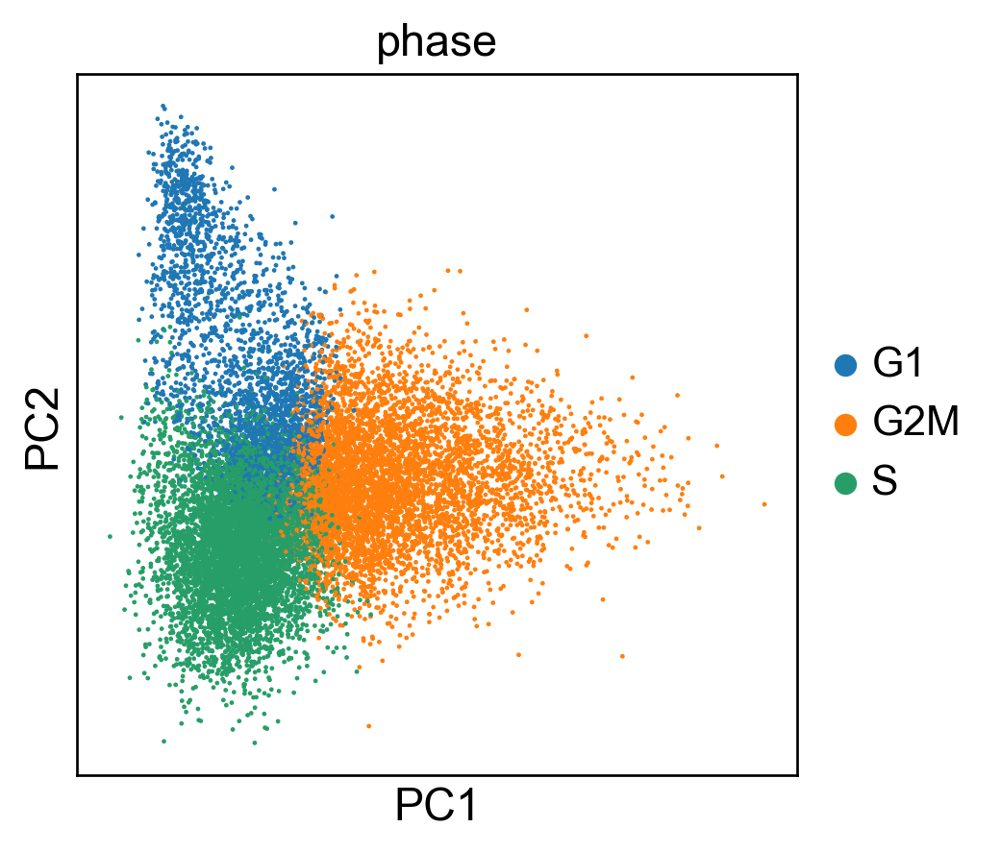

... storing 'phase' as categorical


regressing out ['S_score', 'G2M_score']
    finished (0:03:29.37)
computing PCA with n_comps = 50
    finished (0:00:00.16)


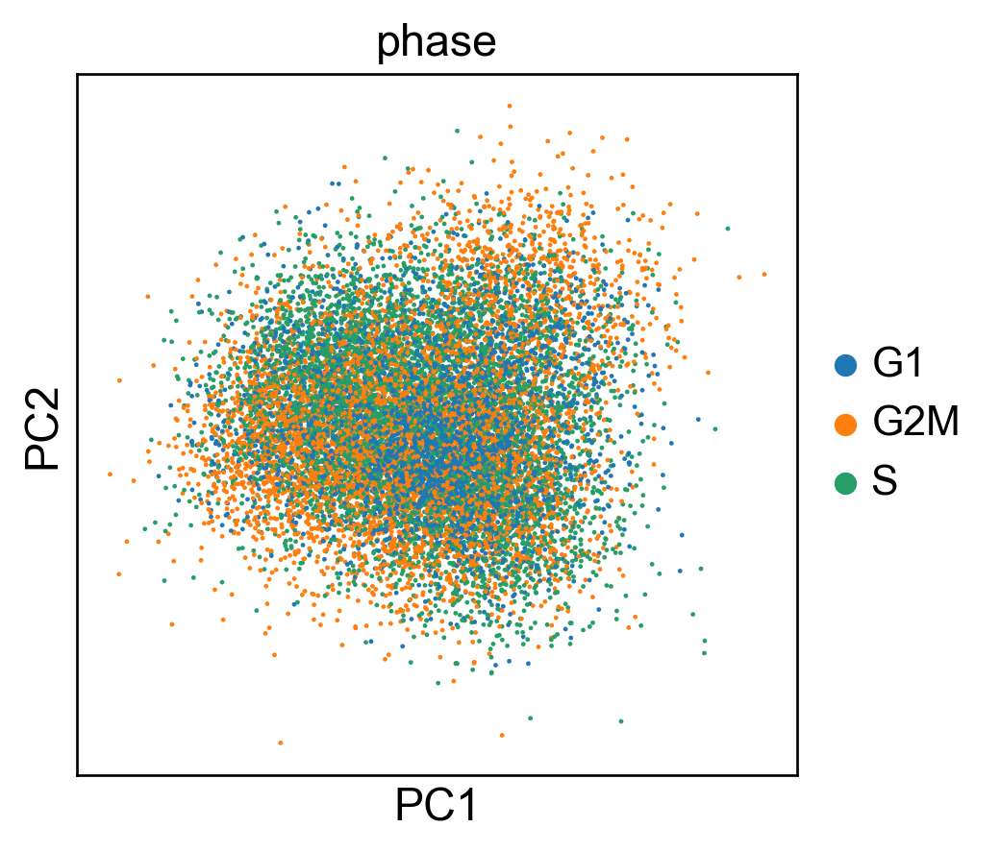

In [7]:
# First need to remove any rows/columns containing all zeros
sc.pp.filter_cells(hsiPS, min_genes=1)
sc.pp.filter_genes(hsiPS, min_cells=1)

# Import cell cycle gene list
cell_cycle_genes = [x.strip() for x in open('./regev_lab_cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in hsiPS.var_names]

# ScanPy "cell cycle scoring" routine w/ random_state behavior enforced
dew.score_genes(hsiPS, gene_list=s_genes, score_name='S_score', random_state=1)
dew.score_genes(hsiPS, gene_list=g2m_genes, score_name='G2M_score', random_state=1)
scores = hsiPS.obs[['S_score', 'G2M_score']]
phase = pd.Series('S', index=scores.index)
phase[scores.G2M_score > scores.S_score] = 'G2M'
phase[np.all(scores < 0, axis=1)] = 'G1'
hsiPS.obs['phase'] = phase

# Visualize cell cycle PCA trends pre-regression
hsiPS_cc_genes = hsiPS[:, cell_cycle_genes]
sc.tl.pca(hsiPS_cc_genes, use_highly_variable=False, svd_solver='arpack')
sc.pl.pca_scatter(hsiPS_cc_genes, color='phase')

# Regress out cell cycle
sc.pp.regress_out(hsiPS, ['S_score', 'G2M_score'])
sc.pp.scale(hsiPS)

# Visualize cell cycle PCA trends post-regression
hsiPS_cc_genes = hsiPS[:, cell_cycle_genes]
sc.tl.pca(hsiPS_cc_genes, use_highly_variable=False, svd_solver='arpack')
sc.pl.pca_scatter(hsiPS_cc_genes, color='phase')

### Compute Embeddings

In [8]:
# Perform PCA and construct a batch-balanced neighbor graph
sc.tl.pca(hsiPS, n_comps=50, svd_solver='arpack', random_state=0)
bbknn.bbknn(hsiPS, batch_key='batch', approx=True, metric='euclidean', local_connectivity=10, trim=12)
dew.export_to_graphml(hsiPS, filename='gephi/hsiPS_bb.graphml')

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:02.49)
computing batch balanced neighbors
	finished (0:00:09.30) --> added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix


In [9]:
# Compute layout of the single-cell graph with ForceAtlas2
#sc.tl.draw_graph(hsiPS, layout='fa', iterations=1000)

# Alternatively, import interactive ForceAtlas2 layout from Gephi
hsiPS = dew.import_pajek_xy(hsiPS, filename='gephi/hsiPS_bb.net')

drawing single-cell graph using layout "fa"
    finished (0:00:01.22) --> added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm)


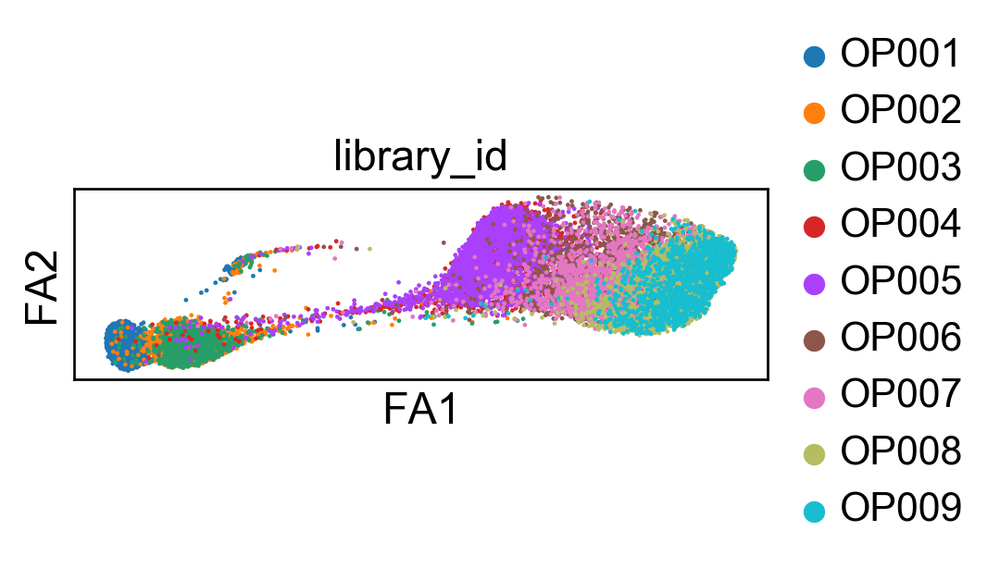

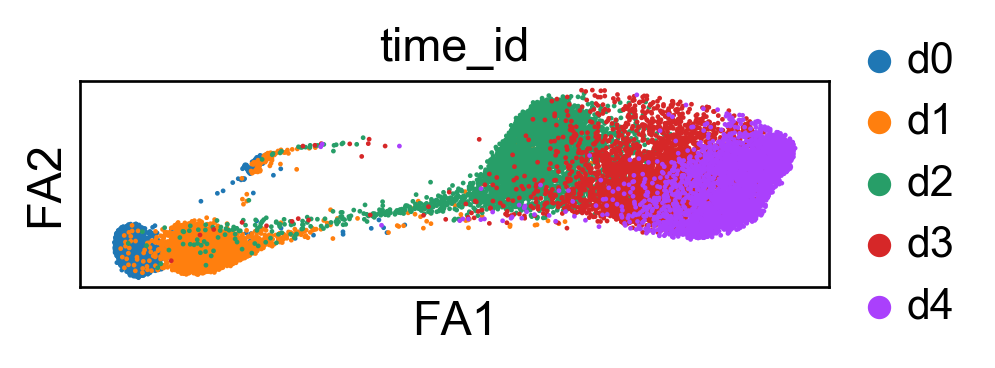

In [10]:
# Plot the ForceAtlas2 graph
sc.pl.draw_graph(hsiPS, color=['library_id'], edges=False, show=False); dew.format_axes()
sc.pl.draw_graph(hsiPS, color=['time_id'], edges=False, show=False); dew.format_axes() 

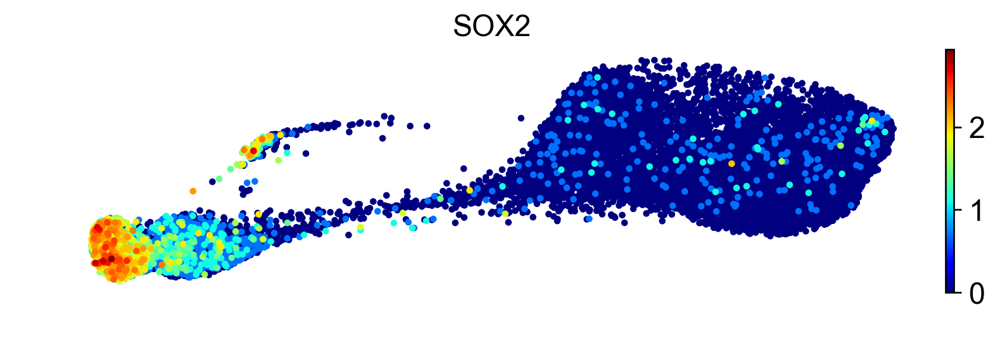

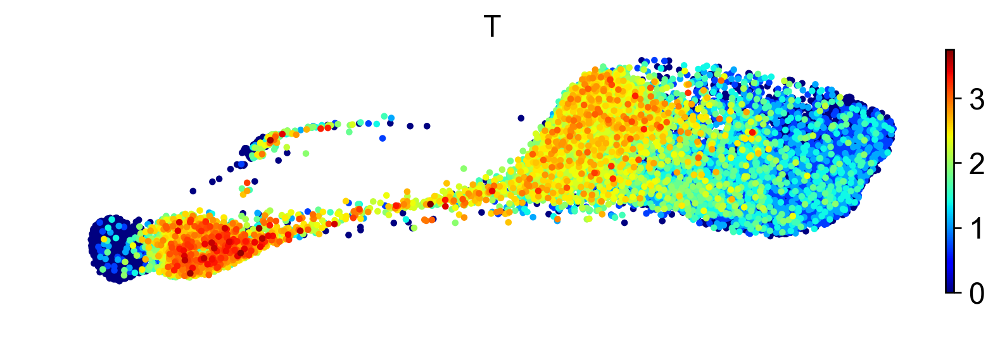

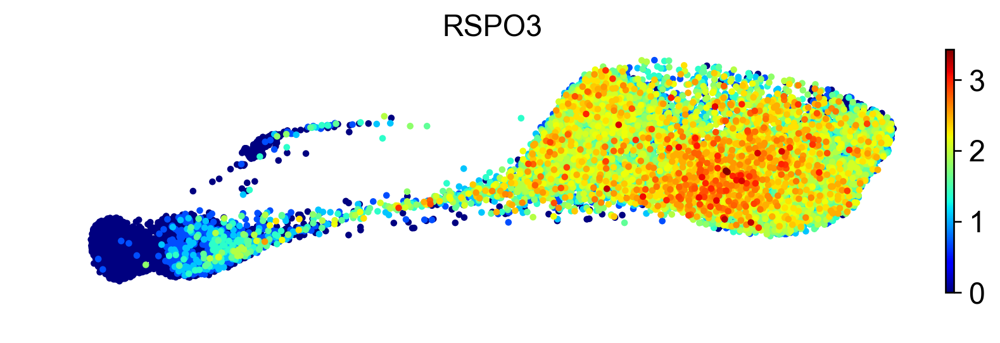

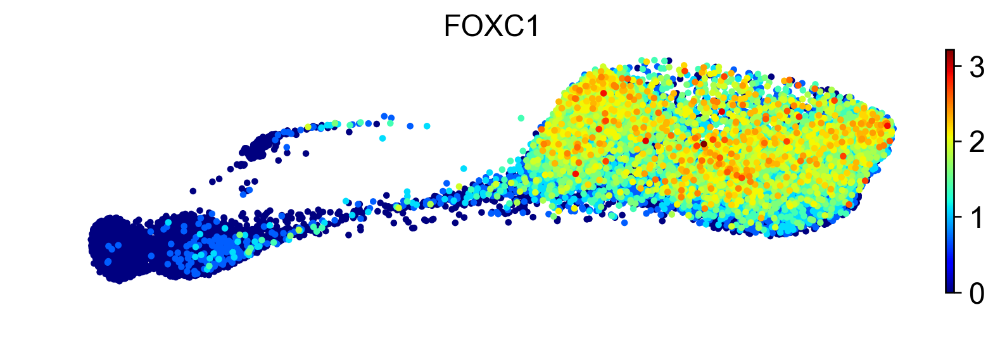

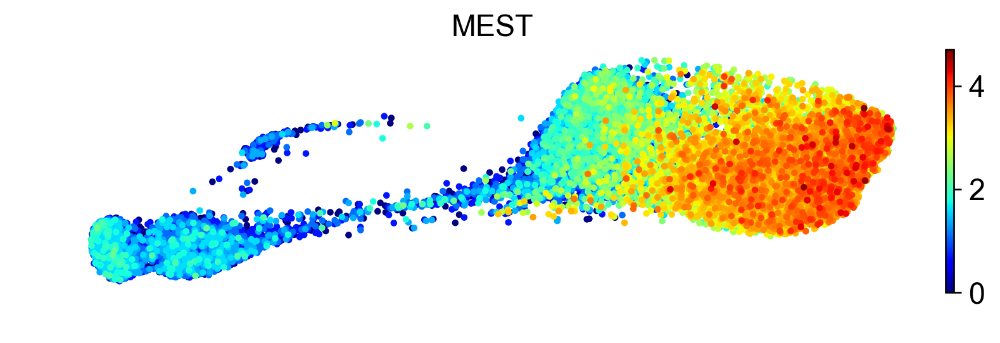

...

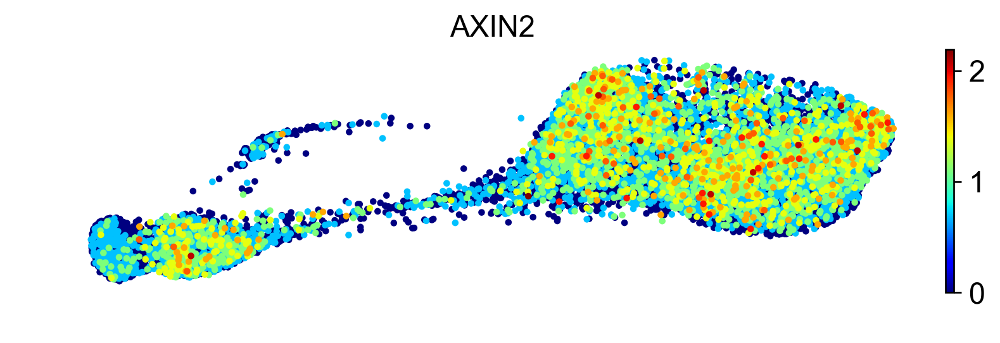

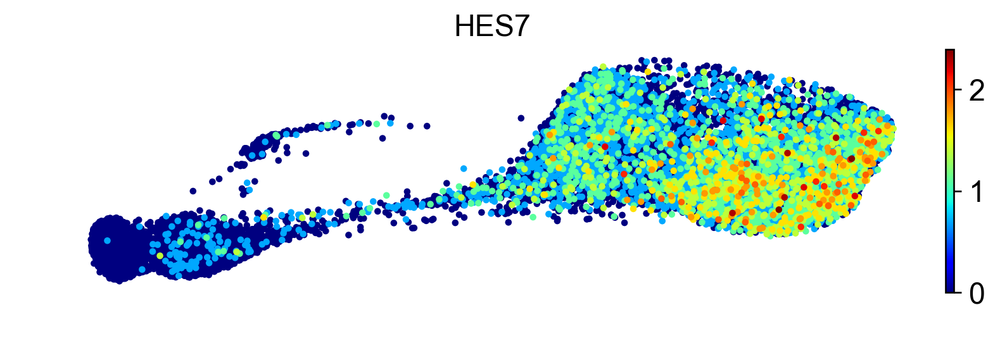

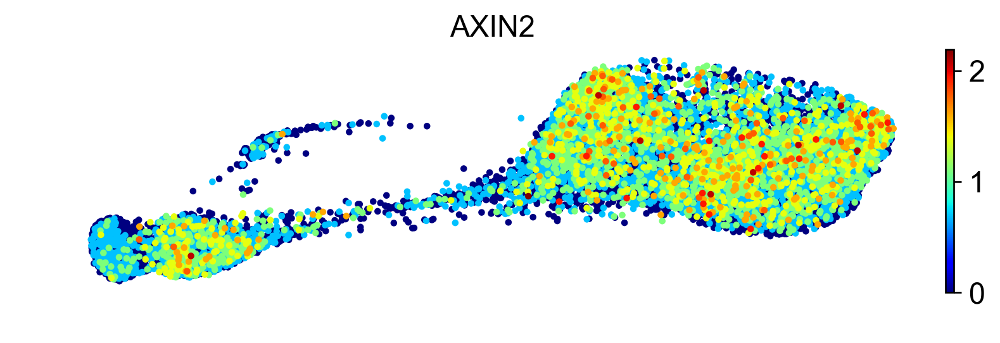

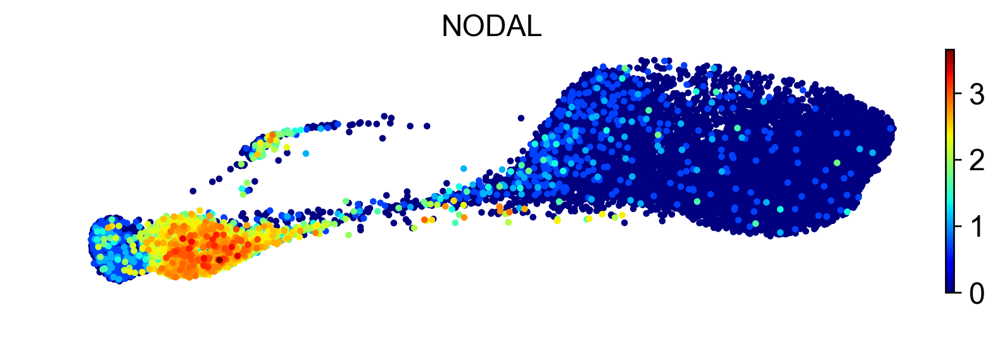

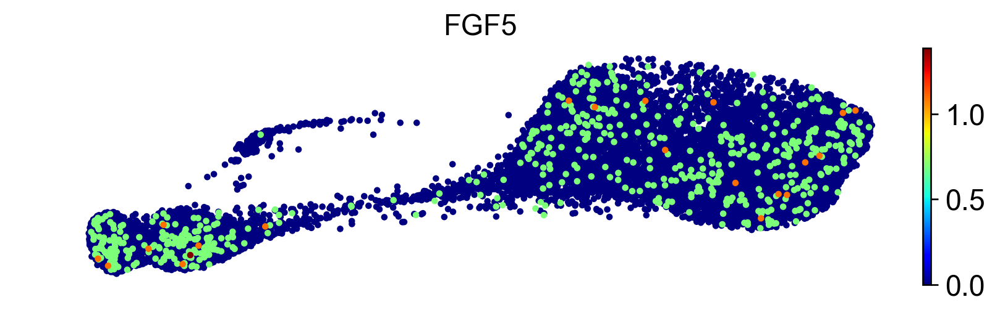

In [11]:
# Overlay gene expression values
genes = ['SOX2','T','RSPO3','FOXC1','MEST', 'DLL1', 'DLL3', 'ALDH1A2', 'APLNR', 'FN1', 'FST', 'FGF17',
         'SPRY4','LFNG','SPRY2','AXIN2','HES7','AXIN2','NODAL','FGF5']

for gn in genes:
    sc.pl.draw_graph(hsiPS, size=40, use_raw=True, color=[gn], edges=False, frameon=False, legend_loc='None',
                     legend_fontsize=10, legend_fontweight='bold', cmap='jet', show=False, title=gn)
    dew.format_axes(eq_aspect=[0], rm_colorbar=False)
    plt.subplots_adjust(bottom=0, left=0, right=2, top=0.4)
    plt.savefig('figures/draw_graph_fa_hsIPS_gene_'+gn+'.png', dpi=600, bbox_inches='tight')    

### Perform Clustering

In [12]:
# Leiden and Louvain clustering
sc.tl.leiden(hsiPS, resolution=0.6, use_weights=True, random_state=0)  
sc.tl.louvain(hsiPS, resolution=0.5, use_weights=True, random_state=0)  

running Leiden clustering
    finished (0:00:02.25) --> found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:01.76) --> found 10 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


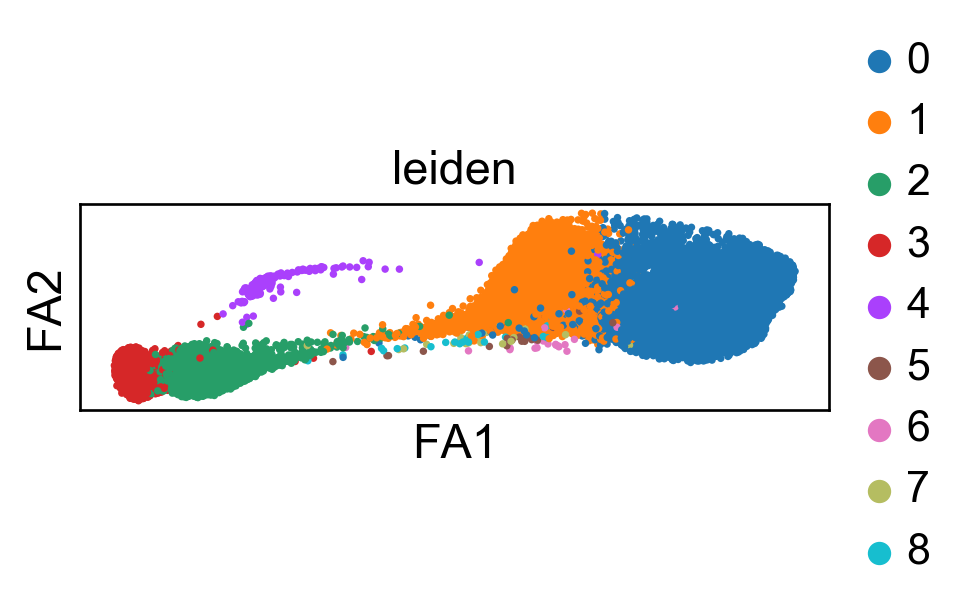

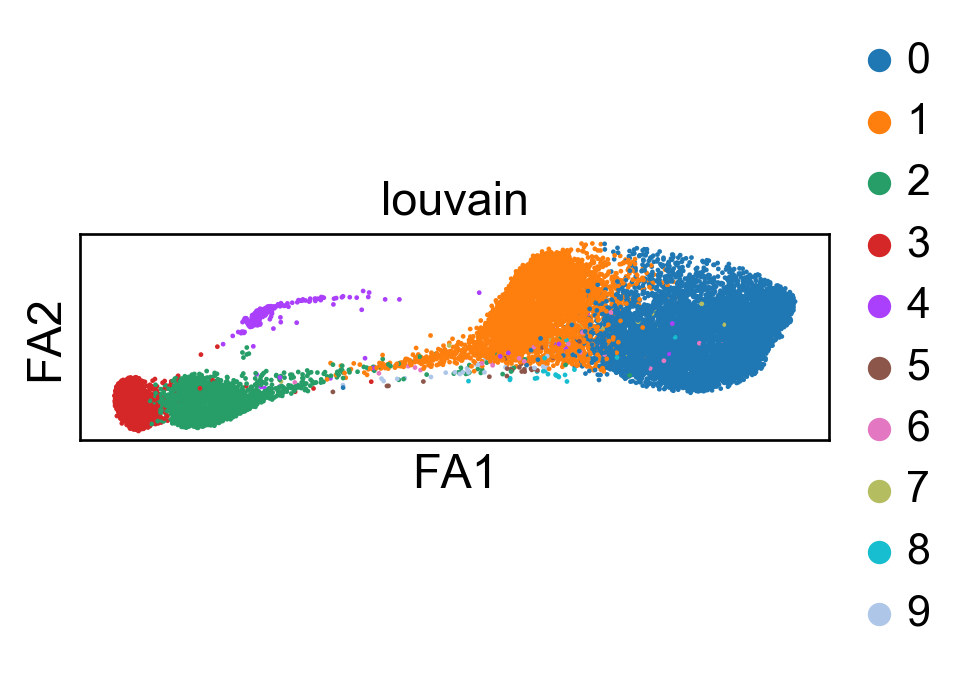

In [13]:
# Overlay cell cluster assignments
sc.pl.draw_graph(hsiPS, color=['leiden'], size=20, edges=False, show=False); dew.format_axes() 
sc.pl.draw_graph(hsiPS, color=['louvain'], edges=False, show=False); dew.format_axes() 

In [15]:
# Manual annotation of cluster names, focus on the five major clusters
new_leiden_names = ['d3-4', 'd2', 'd0-1', 'str', 'unk1','unk2','unk3','unk4','unk5'] 
new_louvain_names = ['d3-4 aPSM', 'd2 MPC', 'd1 NMP', 'd0 iPSC', 'str', 'unk1','unk2','unk3','unk4','unk5'] 
hsiPS.rename_categories('leiden', new_leiden_names)
hsiPS.rename_categories('louvain', new_louvain_names)

# Print fraction of cells in each cluster
nTotalCells = len(hsiPS.obs)
for name in new_louvain_names:
    nCells = sum(hsiPS.obs['louvain'].isin([name]))
    fCells = nCells / nTotalCells * 100            
    print(name + ': ' + str(np.round(fCells,decimals=2)) + ' (n=' + str(nCells) + ')')
print('Total nCells: ' + str(nTotalCells))

d3-4 aPSM: 39.62 (n=5844)
d2 MPC: 28.6 (n=4218)
d1 NMP: 17.26 (n=2546)
d0 iPSC: 12.12 (n=1788)
str: 1.54 (n=227)
unk1: 0.19 (n=28)
unk2: 0.18 (n=27)
unk3: 0.17 (n=25)
unk4: 0.16 (n=24)
unk5: 0.16 (n=23)
Total nCells: 14750


In [16]:
# Subset the 5 major louvain clusters
hsiPS_sub = hsiPS[hsiPS.obs['louvain'].isin(['d3-4 aPSM', 'd2 MPC', 'd1 NMP', 'd0 iPSC', 'str']),:]
hsiPS_sub.obs['louvain'].cat.reorder_categories(['d0 iPSC', 'd1 NMP', 'd2 MPC', 'd3-4 aPSM', 'str'], inplace = True)

# Print fraction and number of cells in each major cluster
for name in np.unique(hsiPS_sub.obs['louvain']):
    nCells = sum(hsiPS_sub.obs['louvain'].isin([name]))
    fCells = nCells / nTotalCells * 100            
    print(name + ': ' + str(np.round(fCells,decimals=2)) + ' (n=' + str(nCells) + ')')
print('Total nCells: ' + str(nTotalCells))

d0 iPSC: 12.12 (n=1788)
d1 NMP: 17.26 (n=2546)
d2 MPC: 28.6 (n=4218)
d3-4 aPSM: 39.62 (n=5844)
str: 1.54 (n=227)
Total nCells: 14750


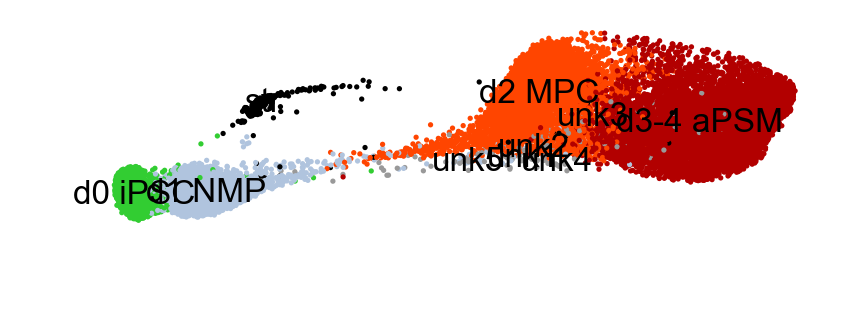

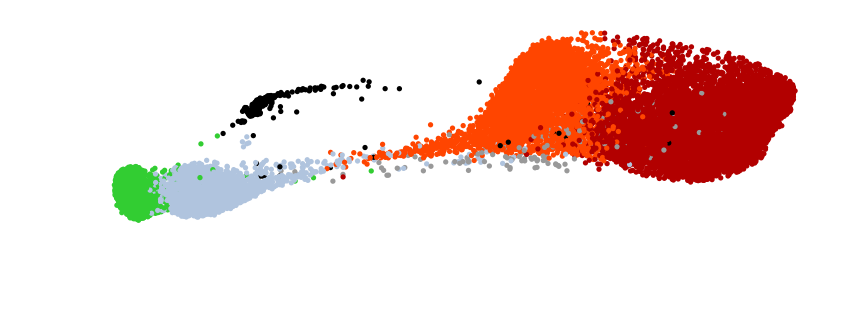

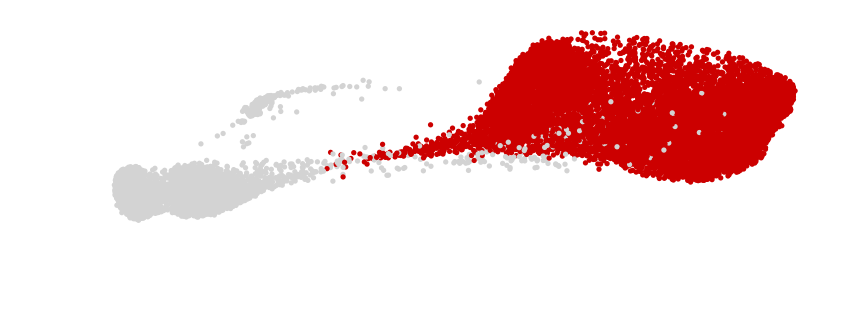

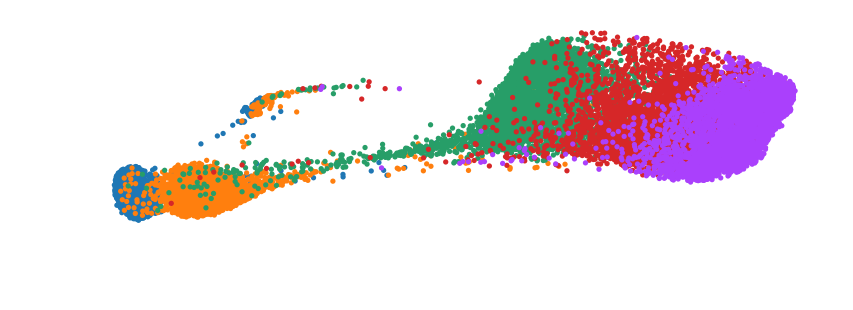

In [17]:
# Overlay new louvain cluster assignments
# Reorder the clusters, add custom colors
hsiPS.obs['louvain'].cat.reorder_categories(['d0 iPSC', 'd1 NMP', 'd2 MPC', 'd3-4 aPSM', 'str', 
                                             'unk1','unk2','unk3','unk4','unk5'], inplace = True)
sc.pl.draw_graph(hsiPS, color=['louvain'], palette=['limegreen','lightsteelblue','orangered',(0.7,0,0),'black', 
                 (0.6,0.6,0.6),(0.6,0.6,0.6),(0.6,0.6,0.6),(0.6,0.6,0.6),(0.6,0.6,0.6)], size=10, edges=False, 
                 frameon=False, title='', legend_loc='on data', legend_fontsize=10, legend_fontweight='medium', 
                 show=False)
dew.format_axes() 
plt.savefig('figures/draw_graph_fa_hsIPS_louvain.pdf', dpi=600, bbox_inches='tight')

# Louvain no labels
sc.pl.draw_graph(hsiPS, color=['louvain'], size=10, edges=False, frameon=False, title='', legend_loc='none', 
                 legend_fontsize=10, legend_fontweight='medium', show=False)
dew.format_axes() 
plt.savefig('figures/draw_graph_fa_hsIPS_louvain_nolabel.png', dpi=600, bbox_inches='tight')

# Louvain no labels - d2-4 PSM 
sc.pl.draw_graph(hsiPS, color=['louvain'], groups=['d2 MPC','d3-4 aPSM'], palette=[(0.8,0,0),(0.8,0,0)], size=10, 
                 edges=False, frameon=False, title='', legend_loc='none', legend_fontsize=10, 
                 legend_fontweight='medium', show=False)
dew.format_axes() 
plt.savefig('figures/draw_graph_fa_hsIPS_louvain_PSM_nolabel.png', dpi=600, bbox_inches='tight')

# Time no labels
sc.pl.draw_graph(hsiPS, color=['time_id'], size=10, edges=False, frameon=False, title='', legend_loc='none', 
                 legend_fontsize=10, legend_fontweight='medium', show=False)
dew.format_axes() 
plt.savefig('figures/draw_graph_fa_hsIPS_timeid_nolabel.png', dpi=600, bbox_inches='tight')

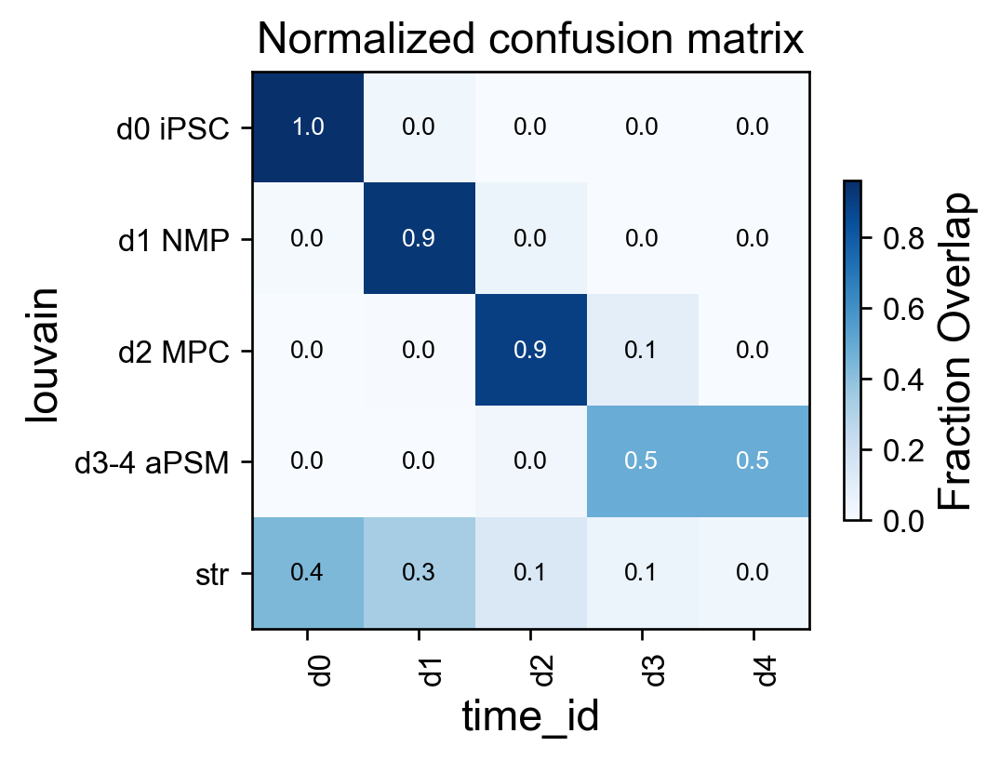

In [18]:
# Plot a confusion matrix to compare clustering assignments
fg,ax = dew.plot_confusion_matrix(hsiPS_sub.obs['time_id'], hsiPS_sub.obs['louvain'], normalize=True, overlay_values=True)
fg.savefig('./figures/confmat_hsIPS_louvaintime.png', bbox_inches='tight')

### Summarize Marker Gene Expression

saving figure to file ./figures/heatmap_hox_timeid.png


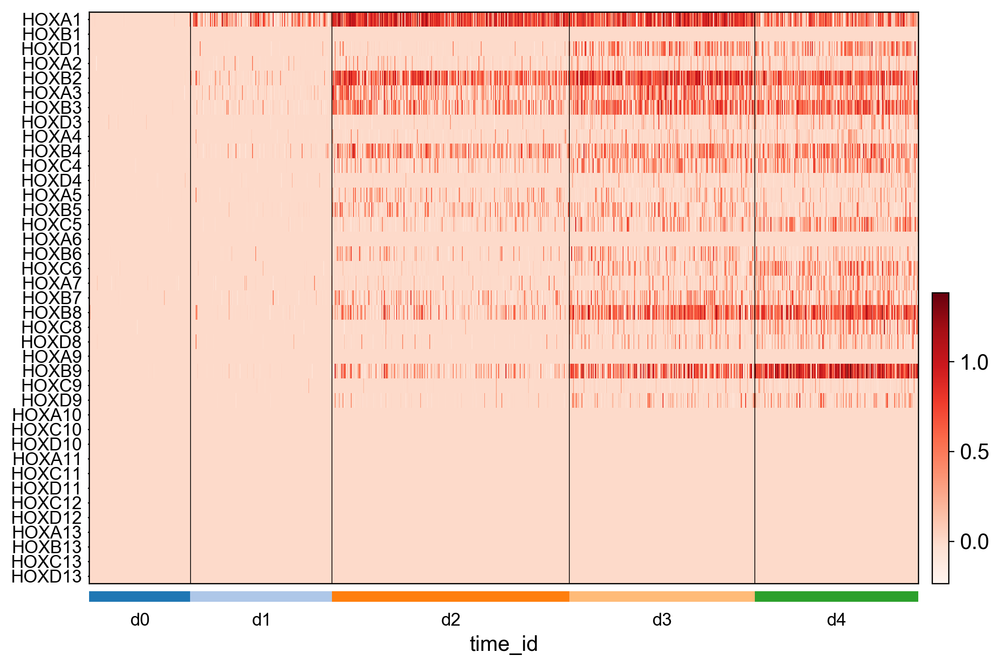

GridSpec(3, 3, height_ratios=[0, 7.02, 0.13], width_ratios=[10, 0, 0.2])

In [19]:
# Generate HOX Heatmap (Timepoints)
human_hox=['HOXA1','HOXB1','HOXD1','HOXA2','HOXB2','HOXA3','HOXB3','HOXD3','HOXA4','HOXB4','HOXC4','HOXD4','HOXA5','HOXB5','HOXC5','HOXA6','HOXB6','HOXC6','HOXA7','HOXB7','HOXB8','HOXC8','HOXD8','HOXA9','HOXB9','HOXC9','HOXD9','HOXA10','HOXC10','HOXD10','HOXA11','HOXC11','HOXD11','HOXC12','HOXD12','HOXA13','HOXB13','HOXC13','HOXD13'] 
hsiPS_nostr = hsiPS_sub[hsiPS_sub.obs['louvain'].isin(['d0 iPSC', 'd1 NMP', 'd2 MPC', 'd3-4 aPSM']),:] # Subset only the non-stressed clusters
sc.pl.heatmap(hsiPS_nostr, human_hox, groupby='time_id', use_raw=True, log=True, num_categories=7, 
              dendrogram=False, gene_symbols=None, var_group_positions=None, var_group_labels=None, 
              var_group_rotation=None, layer=None, standard_scale=None, swap_axes=True, 
              show_gene_labels=None, show=None, save='_hox_timeid.png', figsize=None, cmap='Reds')

### Predict Cell States Using EE95 Classifier

In [20]:
# Load E95Classifier and predict cell states
E95Classifier = pickle.load(open('../mmE95/E95Classifier.pickle','rb'))
hsiPS = dew.predict_classes(hsiPS, E95Classifier)

... storing 'pr_NearestNeighbors' as categorical
... storing 'pr_RandomForest' as categorical
... storing 'pr_NeuralNet' as categorical
... storing 'pr_LDA' as categorical


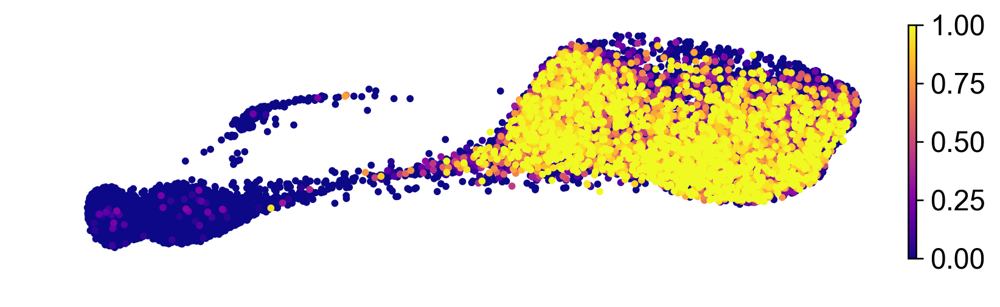

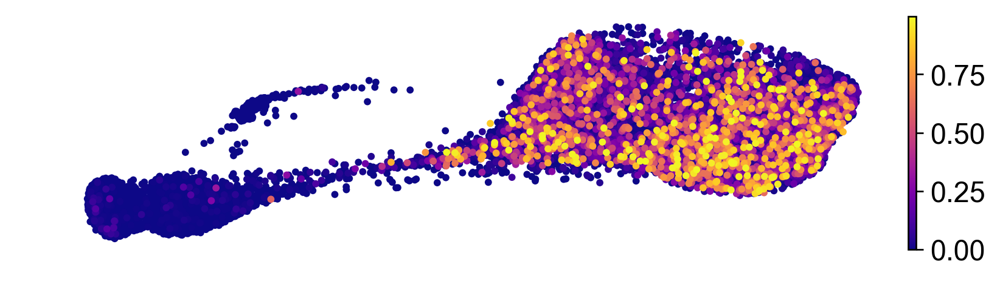

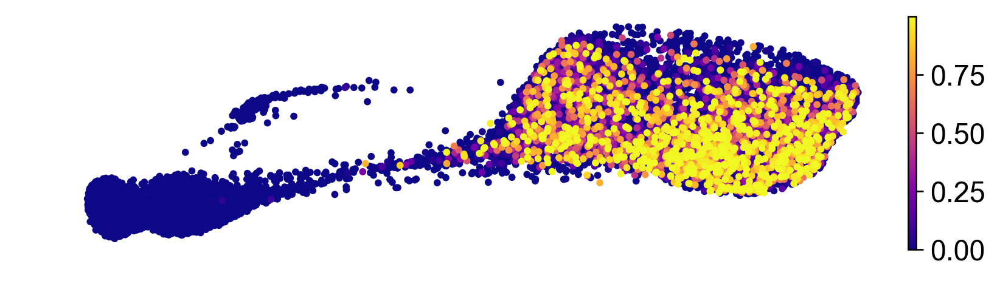

In [21]:
# Overlay classifier probabilities
cls = ['pPSM']
alg = ['NearestNeighbors', 'NeuralNet', 'LDA']

for cl in cls:
    for al in alg:
        hsiPS.obs['_']=hsiPS.obsm['proba_'+al][:,np.where(E95Classifier['Classes']==cl)[0][0]]
        sc.pl.draw_graph(hsiPS, color='_', edges=False, frameon=False, legend_loc='None',
                         legend_fontsize=10, size=50, legend_fontweight='bold', cmap='plasma', 
                         show=False, title='')#al+'_'+cl'')
        dew.format_axes(eq_aspect=[0])
        plt.subplots_adjust(bottom=0, left=0, right=2, top=0.4) 
        #ax = plt.gcf().axes; ax[1].set_ylim([0,1])
        plt.savefig('figures/classifier_proba/draw_graph_fa_hsIPS_proba_'+al+'_'+cl+'.png', dpi=600, bbox_inches='tight')

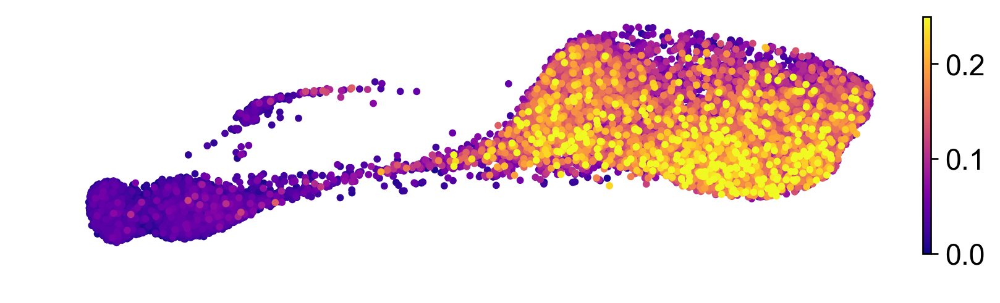

In [22]:
# Overlay classifier probabilities
cls = ['pPSM']
alg = ['RandomForest']

for cl in cls:
    for al in alg:
        hsiPS.obs['_']=hsiPS.obsm['proba_'+al][:,np.where(E95Classifier['Classes']==cl)[0][0]]
        sc.pl.draw_graph(hsiPS, color='_', edges=False, frameon=False, legend_loc='None',
                         legend_fontsize=10, size=50,legend_fontweight='bold', cmap='plasma', vmin=0, vmax=0.25,
                         show=False, title='')#al+'_'+cl'')
        dew.format_axes(eq_aspect=[0])
        plt.subplots_adjust(bottom=0, left=0, right=2, top=0.4) 
        #ax = plt.gcf().axes; ax[1].set_ylim([0,1])
        plt.savefig('figures/classifier_proba/draw_graph_fa_hsIPS_proba_'+al+'_'+cl+'.png', dpi=600, bbox_inches='tight')

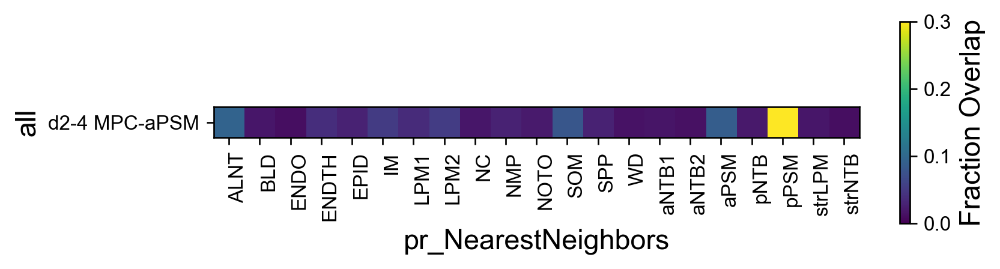

In [23]:
# Compare classification results 
hsiPS_PSM = hsiPS[hsiPS.obs['louvain'].isin(['d2 MPC','d3-4 aPSM']),:]
hsiPS_PSM.obs['all']='d2-4 MPC-aPSM'
alg = ['NearestNeighbors']

for al in alg:
    dew.plot_confusion_matrix(hsiPS_PSM.obs['pr_'+al],hsiPS_PSM.obs['all'], title=' ', 
                              normalize=True, cmap='viridis', vmin=0, vmax=0.3)
    plt.subplots_adjust(bottom=0, left=0, right=1.4, top=0.7)
    plt.savefig('figures/classifier_conf/Louvain_v_pr'+al+'.png', dpi=600, bbox_inches='tight')

### Get Marker Genes

In [56]:
sc.tl.rank_genes_groups(hsiPS_sub, 'louvain', use_raw=True, groups='all', reference='rest', n_genes=100, 
                        method='wilcoxon', corr_method='benjamini-hochberg', log_transformed=True)

ranking genes
    finished (0:00:37.24) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain']`


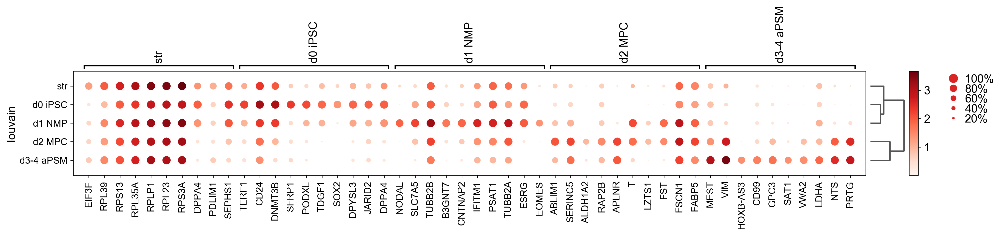

In [57]:
sc.tl.dendrogram(hsiPS_sub, groupby='louvain')
sc.pl.rank_genes_groups_dotplot(hsiPS_sub)

In [58]:
# Generate a tables of differentially expressed genes for each group
deg = hsiPS_sub.uns['rank_genes_groups']
groups = deg['names'].dtype.names

# Format a table with top 100 gene names and corrected p-values, export to excel
df_names_pvals = pd.DataFrame({groups+'_'+key: deg[key][groups] for groups in groups for key in ['names','logfoldchanges','pvals']}).head(100)
df_names_pvals.to_excel('tables/hsiPS_DEGTable.xlsx')

In [59]:
# Print top 20 gene names to screen~
pd.DataFrame({groups : deg[key][groups] for groups in groups for key in ['names']}).head(20)

,d0 iPSC,d1 NMP,d2 MPC,d3-4 aPSM,str
0,TERF1,NODAL,ABLIM1,MEST,EIF3F
1,CD24,SLC7A5,SERINC5,VIM,RPL39
2,DNMT3B,TUBB2B,ALDH1A2,HOXB-AS3,RPS13
3,SFRP1,B3GNT7,RAP2B,CD99,RPL35A
4,PODXL,CNTNAP2,APLNR,GPC3,RPLP1
5,TDGF1,IFITM1,T,SAT1,RPL23
6,SOX2,PSAT1,LZTS1,VWA2,RPS3A
7,DPYSL3,TUBB2A,FST,LDHA,DPPA4
8,JARID2,ESRG,FSCN1,NTS,PDLIM1
9,DPPA4,EOMES,FABP5,PRTG,SEPHS1


In [66]:
# Print number of cells in each cluster
nTotalCells = len(hsiPS_sub.obs)
for name in np.unique(hsiPS_sub.obs['louvain']):
    nCells = sum(hsiPS_sub.obs['louvain'].isin([name]))
    fCells = nCells / nTotalCells * 100            
    print(name + ': ' + str(nCells))
print('Total nCells: ' + str(nTotalCells))

d0 iPSC: 1788
d1 NMP: 2546
d2 MPC: 4218
d3-4 aPSM: 5844
str: 227
Total nCells: 14623


### Compute Pseudotime

In [28]:
# Generate a graph abstraction flag for PSM trajectory cells
PSMTF = hsiPS.obs['louvain'].isin(['d0 iPSC','d1 NMP','d2 MPC','d3-4 aPSM'])
hsiPS.obs['PAGAFlag']='notPSM'
hsiPS.obs['PAGAFlag'][PSMTF]='PSM'
sc.tl.paga(hsiPS, groups='PAGAFlag')

/Users/dan/miniconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
... storing 'PAGAFlag' as categorical


running PAGA
    finished (0:00:00.51) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)


In [29]:
# Calculate dpt pseudotime, starting from the d0 cluster
hsiPS.uns['iroot'] = np.flatnonzero(hsiPS.obs['louvain']  == 'd0 iPSC')[0]
sc.tl.diffmap(hsiPS)
sc.tl.dpt(hsiPS)

computing Diffusion Maps using n_comps=15(=n_dcs)
    eigenvalues of transition matrix
    [1.0000029  0.99457574 0.9815149  0.97636366 0.9702829  0.9414652
     0.93036836 0.9240623  0.9151921  0.90937823 0.90741354 0.90319157
     0.89916986 0.89208925 0.8898709 ]
    finished (0:00:00.34) --> added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns)
computing Diffusion Pseudotime using n_dcs=10
    finished (0:00:00.00) --> added
    'dpt_pseudotime', the pseudotime (adata.obs)


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


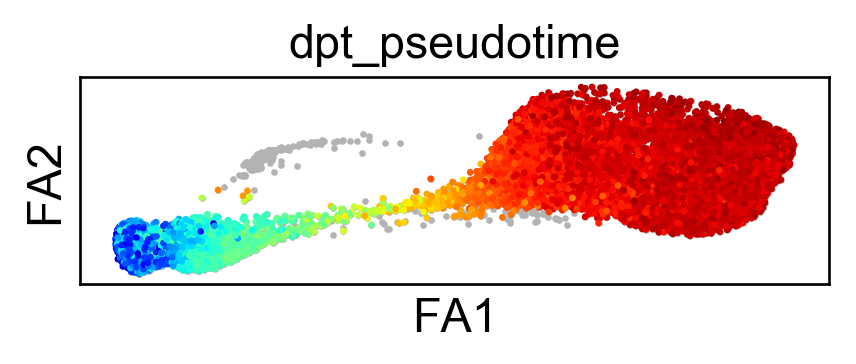

In [30]:
# Plot dpt values just for the PSM path
fig,ax =plt.subplots(figsize=(4,4))
ax.scatter(hsiPS.obsm['X_draw_graph_fa'][:,0], hsiPS.obsm['X_draw_graph_fa'][:,1], 
           c=[.7,.7,.7], s=1)
ax.scatter(hsiPS.obsm['X_draw_graph_fa'][:,0][PSMTF], hsiPS.obsm['X_draw_graph_fa'][:,1][PSMTF], 
           c=hsiPS.obs['dpt_pseudotime'][PSMTF], cmap='jet', s=1)
ax.set_xticks([]); ax.set_yticks([]);
ax.set_xlabel('FA1'); ax.set_ylabel('FA2'); ax.set_title('dpt_pseudotime')
dew.format_axes() 
fig.savefig('./figures/draw_graph_fa_hsIPS_sub_dpt.png', bbox_inches='tight')

### Plot Gene Expression Trajectories

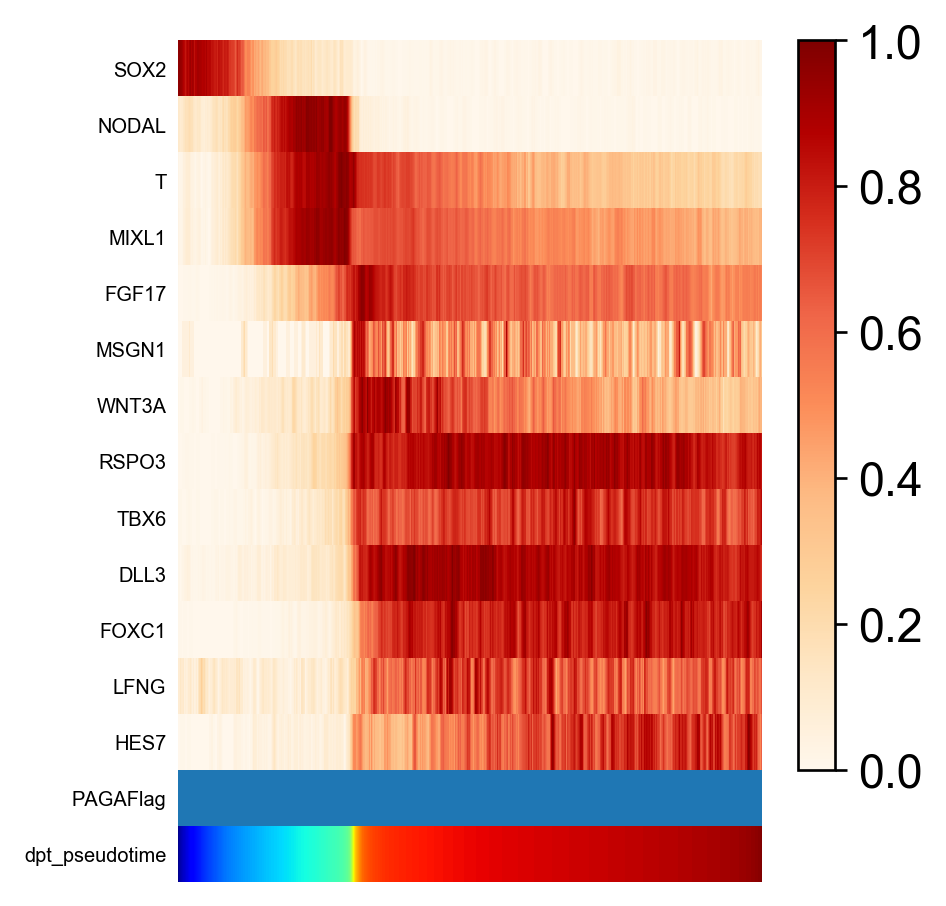

In [31]:
# Plot gene expression trajectories for select markers
traj_genes = ['SOX2','NODAL','T','MIXL1','FGF17','MSGN1','WNT3A','RSPO3','TBX6','DLL3','FOXC1','LFNG','HES7']
ax = sc.pl.paga_path(hsiPS, nodes=['PSM'], keys=traj_genes, use_raw=True, annotations=['dpt_pseudotime'],
                     color_map='OrRd', color_maps_annotations={'dpt_pseudotime': 'jet'}, palette_groups=None, 
                     n_avg=100, groups_key='PAGAFlag', xlim=[None, None], title=None, left_margin=None, ytick_fontsize=6, 
                     title_fontsize=None, show_node_names=False, show_yticks=True, show_colorbar=True, 
                     legend_fontsize=1, legend_fontweight=None, normalize_to_zero_one=True, as_heatmap=True, 
                     return_data=True, show=False, ax=None)
plt.savefig('figures/paga_path_markers.png', dpi=2000, bbox_inches='tight')


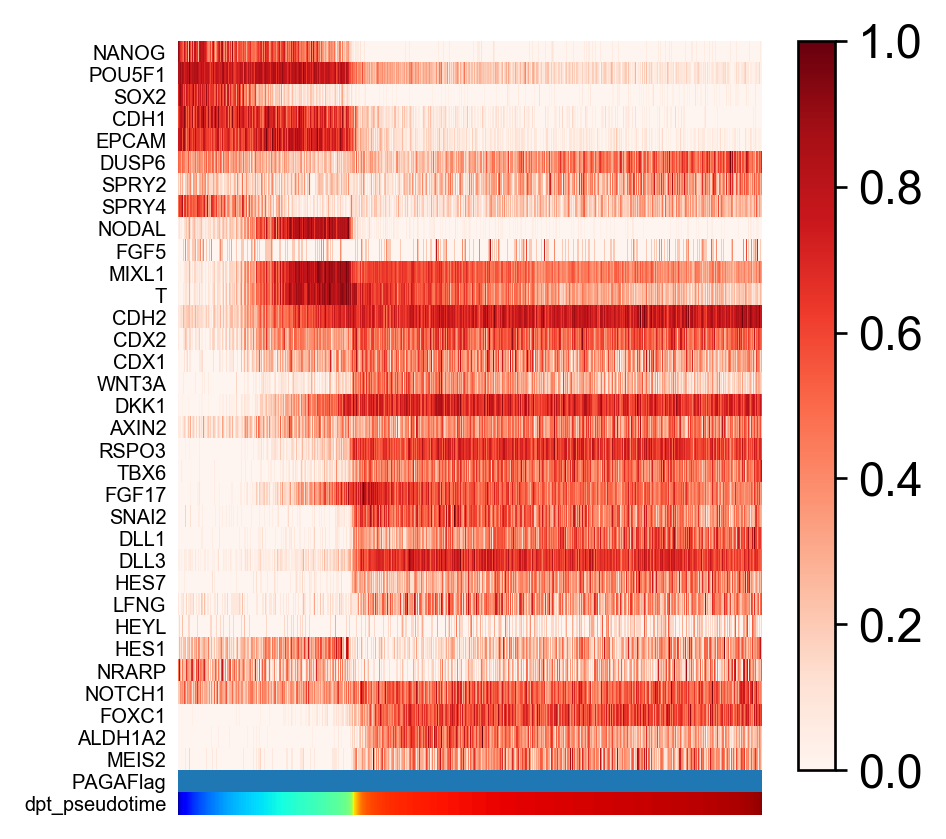

In [32]:
# Plot gene expression trajectories for select markers (supplement)
traj_genes=['NANOG','POU5F1','SOX2','CDH1','EPCAM','DUSP6','SPRY2','SPRY4','NODAL','FGF5','MIXL1','T','CDH2','CDX2','CDX1','WNT3A','DKK1','AXIN2','RSPO3','TBX6','FGF17','SNAI2','DLL1','DLL3','HES7','LFNG','HEYL','HES1','NRARP','NOTCH1','FOXC1','ALDH1A2','MEIS2']
ax = sc.pl.paga_path(hsiPS, nodes=['PSM'], keys=traj_genes, use_raw=True, annotations=['dpt_pseudotime'],
                     color_map='Reds', color_maps_annotations={'dpt_pseudotime': 'jet'}, palette_groups=None, 
                     n_avg=10, groups_key='PAGAFlag', xlim=[None, None], title=None, left_margin=None, ytick_fontsize=6, 
                     title_fontsize=None, show_node_names=False, show_yticks=True, show_colorbar=True, 
                     legend_fontsize=1, legend_fontweight=None, normalize_to_zero_one=True, as_heatmap=True, 
                     return_data=True, show=False, ax=None)
plt.savefig('figures/paga_path_markers_supp.png', dpi=2000, bbox_inches='tight')


### ________________________
  
  

### Save Fully Analyzed DataSet 

In [33]:
hsiPS.obs.to_csv('Diaz2019_hsiPS_full_obs.csv')
hsiPS.write('Diaz2019_hsiPS_full.h5ad')

### Load Fully Analyzed DataSet 

In [ ]:
hsiPS = sc.read('Diaz2019_hsiPS_full.h5ad')
print(hsiPS)

### ________________________
  
  

### Generate SPRING Plots

In [39]:
# Flip the y-axis for compatibility with SPRING
hsiPS.obsm['X_forSPRING']=hsiPS.obsm['X_draw_graph_fa']
hsiPS.obsm['X_forSPRING'][:,1]=-1*hsiPS.obsm['X_forSPRING'][:,1]

sc.external.exporting.spring_project(hsiPS, 'hsIPS_SPRING', 'X_forSPRING', subplot_name='full', 
                                cell_groupings=['louvain','library_id','time_id'], custom_color_tracks=['n_counts','n_genes','dpt_pseudotime'], 
                                total_counts_key='n_counts', overwrite=True)


Writing subplot to hsIPS_SPRING/full/
